# VietAI Final Project
Hoàng Minh Thiên - student242331@ptnk.edu.vn

## Đề tài
Dự đoán khả năng có bệnh tim

## Loại mô hình
Classification

## Môi trường
Local, MacBook Air M3

## Dataset
[UCI Heart Disease Data](https://www.kaggle.com/datasets/redwankarimsony/heart-disease-data)

## Cài đặt thư viện

In [23]:
!pip install -qU tensorflow scikit-learn numpy seaborn matplotlib pandas xgboost lightgbm imbalanced-learn ydata-profiling[notebook]
%matplotlib inline

## Imports

In [24]:
import time
from os import makedirs

import matplotlib.pyplot as plt
import pandas as pd
import seaborn
import tensorflow as tf
from imblearn.over_sampling import SMOTE
from lightgbm import LGBMClassifier
from scipy.stats import randint, uniform
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix, precision_score, recall_score
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.callbacks import EarlyStopping
from xgboost import XGBClassifier
from ydata_profiling import ProfileReport


## Constants

In [25]:
SEED = 7
tf.random.set_seed(SEED)

## Folders và log f

In [26]:
makedirs('./figures', exist_ok=True)
makedirs('./reports', exist_ok=True)
log_file = open('./logs.txt', 'w')


def log(msg):
    msg = f'[{time.strftime("%Y-%m-%d %H:%M:%S", time.localtime())}] {msg}'
    print(msg)
    log_file.write(msg + '\n')

## Load dataset

In [27]:
df = pd.read_csv('./data/heart_disease_uci.csv')

## Phân tích dữ liệu

In [28]:
report = ProfileReport(df, title='Heart Disease Dataset Report')
report.to_notebook_iframe()
report.to_file('./reports/dataset_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:00<00:00, 4879.23it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Tiền xử lý dữ liệu

In [29]:
def preprocess(input_df):
    # Drop the id column
    input_df = input_df.drop(columns=['id'])

    # Drop columns with a high-missing value rate
    input_df = input_df.drop(columns=['ca', 'thal'])

    # Impute numeric columns with median values
    numeric_cols = input_df.select_dtypes(include='number').columns
    input_df[numeric_cols] = input_df[numeric_cols].fillna(input_df[numeric_cols].median())

    # Convert age into categorical
    input_df['age_group'] = pd.cut(input_df['age'], bins=[29, 40, 55, 70, 100],
                                   labels=['Young', 'Middle-aged', 'Senior', 'Elderly'])
    input_df = input_df.drop(columns=['age'])

    # Impute categorical columns with the modes
    cat_cols = input_df.select_dtypes(include=['object', 'string', 'category']).columns
    input_df[cat_cols] = input_df[cat_cols].fillna(input_df[cat_cols].mode().iloc[0])

    # One-hot encoding the categorical values
    oh_encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
    oh_encoded_df = pd.DataFrame(oh_encoder.fit_transform(input_df[cat_cols]),
                                 columns=oh_encoder.get_feature_names_out(cat_cols), index=input_df.index)
    input_df = pd.concat([input_df.drop(columns=cat_cols), oh_encoded_df], axis=1)

    # Convert the stage to presence of heart disease (df['num'] > 0)
    input_df['has_heart_disease'] = input_df['num'].apply(lambda x: 1 if x > 0 else 0)
    input_df = input_df.drop(columns=['num'])

    # Remove duplicated rows
    input_df = input_df.drop_duplicates()
    input_df = input_df.reset_index(drop=True)

    return input_df

In [30]:
df = preprocess(df)
df.head()

,trestbps,chol,thalch,oldpeak,sex_Female,sex_Male,dataset_Cleveland,dataset_Hungary,dataset_Switzerland,dataset_VA Long Beach,...,exang_False,exang_True,slope_downsloping,slope_flat,slope_upsloping,age_group_Elderly,age_group_Middle-aged,age_group_Senior,age_group_Young,has_heart_disease
0,145.0,233.0,150.0,2.3,0.0,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,160.0,286.0,108.0,1.5,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1
2,120.0,229.0,129.0,2.6,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1
3,130.0,250.0,187.0,3.5,0.0,1.0,1.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0
4,130.0,204.0,172.0,1.4,1.0,0.0,1.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0


## Phân tích dữ liệu (sau tiền xử lý)

In [31]:
report = ProfileReport(df, title='Heart Disease Dataset Report (After Preprocessing)')
report.to_notebook_iframe()
report.to_file('./reports/dataset_report_after_preprocessing.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 29/29 [00:00<00:00, 247.03it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Chia bộ dữ liệu (Train, test, validate)

In [32]:
X, y = df.drop(columns=['has_heart_disease']), df['has_heart_disease']


def split_dataset(X, y):
    # The ratio is 7:2:1 for train:test:val
    X_train, X_left, y_train, y_left = train_test_split(X, y, test_size=0.3, random_state=SEED, stratify=y)
    X_test, X_validate, y_test, y_validate = train_test_split(X_left, y_left, test_size=0.3, random_state=SEED,
                                                              stratify=y_left)
    print(f'Train dataset size: {X_train.shape}')
    print(f'Test dataset size: {X_test.shape}')
    print(f'Validate dataset size: {X_validate.shape}')

    return X_train, y_train, X_test, y_test, X_validate, y_validate


X_train, y_train, X_test, y_test, X_validate, y_validate = split_dataset(X, y)

Train dataset size: (642, 28)
Test dataset size: (193, 28)
Validate dataset size: (83, 28)


## SMOTE
Tăng cường dữ liệu giúp bộ dữ liệu cân bằng hơn

In [33]:
def oversample(X, y):
    smote = SMOTE(random_state=SEED, sampling_strategy='minority')
    X_oversampled, y_oversampled = smote.fit_resample(X, y)
    return X_oversampled, y_oversampled

In [34]:
print('Oversampling train dataset:')
print(f'Before oversampling: {y_train.value_counts()}')
X_train, y_train = oversample(X_train, y_train)
print(f'After oversampling: {y_train.value_counts()}')

Oversampling train dataset:
Before oversampling: has_heart_disease
1    355
0    287
Name: count, dtype: int64
After oversampling: has_heart_disease
1    355
0    355
Name: count, dtype: int64


## Các loại biểu đồ

In [35]:
def draw_conf_mat(y_true, y_pred, title='Confusion Matrix'):
    mat = confusion_matrix(y_true, y_pred)
    seaborn.heatmap(mat, square=True, annot=True, fmt='d', cbar=False)
    plt.title(title)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig(f'./figures/{title}.png')
    plt.show()

## Test các model regression khác nhau

[2025-07-06 19:54:39] Evaluating models:
Training Logistic Regression model with hyperparameter tuning...


/Users/davidhoang/ai-venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/davidhoang/ai-venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/davidhoang/ai-venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/davidhoang/ai-venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/davidhoang/ai-venv/lib/python3.11/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/davidhoang/ai-venv/lib/python3.11/site-pack

Best parameters for Logistic Regression: {'C': np.float64(3.90774292152949), 'solver': 'liblinear'}


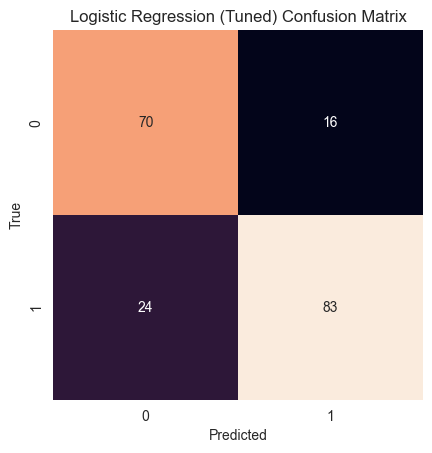

[2025-07-06 19:54:42] Logistic Regression (Tuned) Test Results: F1 score: 0.8058 | Precision: 0.8384 | Recall: 0.7757
Training Random Forest model with hyperparameter tuning...
Best parameters for Random Forest: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 112}


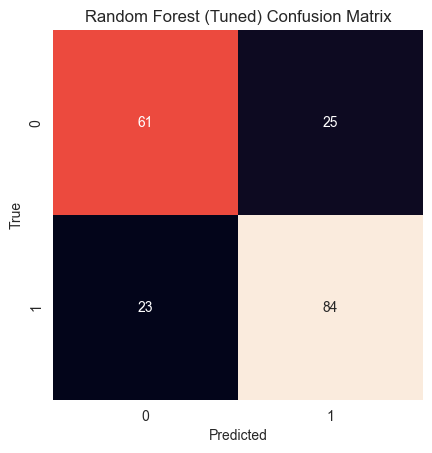

[2025-07-06 19:55:41] Random Forest (Tuned) Test Results: F1 score: 0.7778 | Precision: 0.7706 | Recall: 0.7850
Training XGBoost model with hyperparameter tuning...
Best parameters for XGBoost: {'colsample_bytree': np.float64(0.7483350979559297), 'learning_rate': np.float64(0.01913970352057385), 'max_depth': 6, 'n_estimators': 404, 'subsample': np.float64(0.719708835390237)}


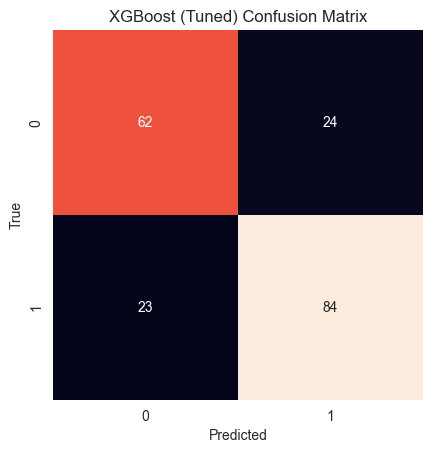

[2025-07-06 19:55:58] XGBoost (Tuned) Test Results: F1 score: 0.7814 | Precision: 0.7778 | Recall: 0.7850
Training LightGBM model with hyperparameter tuning...
Best parameters for LightGBM: {'learning_rate': np.float64(0.021794574191448847), 'max_depth': 19, 'n_estimators': 184, 'num_leaves': 77, 'reg_alpha': np.float64(0.8941453369562156), 'reg_lambda': np.float64(0.5982612275718309), 'verbosity': -1}


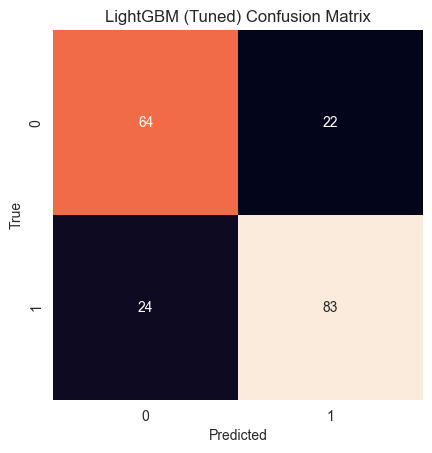

[2025-07-06 20:03:37] LightGBM (Tuned) Test Results: F1 score: 0.7830 | Precision: 0.7905 | Recall: 0.7757
[2025-07-06 20:03:37] Done evaluating models.


In [36]:
logistic_model = LogisticRegression(random_state=SEED, class_weight='balanced')
random_forest_model = RandomForestClassifier(random_state=SEED, class_weight='balanced')
xgboost_model = XGBClassifier(random_state=SEED, eval_metric='logloss')
lgbm_model = LGBMClassifier(random_state=SEED, class_weight='balanced')
models = {
    'Logistic Regression': logistic_model,
    'Random Forest': random_forest_model,
    'XGBoost': xgboost_model,
    'LightGBM': lgbm_model,
}

param_distributions = {
    'Logistic Regression': {
        'C': uniform(loc=0.01, scale=100),  # Continuous distribution for C
        'solver': ['liblinear', 'saga']
    },
    'Random Forest': {
        'n_estimators': randint(low=100, high=500),  # Integer distribution for n_estimators
        'max_depth': [10, 20, 30, None],  # Discrete values
        'min_samples_split': randint(low=2, high=20),  # Integer distribution
        'min_samples_leaf': randint(low=1, high=10)  # Added a new parameter for exploration
    },
    'XGBoost': {
        'n_estimators': randint(low=100, high=500),
        'learning_rate': uniform(loc=0.01, scale=0.2),  # Continuous distribution
        'max_depth': randint(low=3, high=10),
        'subsample': uniform(loc=0.6, scale=0.4),  # Added subsample
        'colsample_bytree': uniform(loc=0.6, scale=0.4)  # Added colsample_bytree
    },
    'LightGBM': {
        'n_estimators': randint(low=100, high=500),
        'learning_rate': uniform(loc=0.01, scale=0.2),
        'num_leaves': randint(low=20, high=100),
        'max_depth': randint(low=5, high=20),  # Added max_depth for LGBM
        'reg_alpha': uniform(loc=0, scale=1),  # L1 regularization
        'reg_lambda': uniform(loc=0, scale=1),  # L2 regularization
        'verbosity': [-1]
    }
}


def evaluate_models(models, param_distributions, X_train, y_train, X_test, y_test, cv=5, n_iter=250):
    best_params_file = open('./best_params.txt', 'w')
    for name, model in models.items():
        best_model = model
        if name in param_distributions:
            print(f'Training {name} model with hyperparameter tuning...')
            random_search = RandomizedSearchCV(estimator=model, param_distributions=param_distributions[name], cv=cv,
                                               n_iter=n_iter, scoring='f1', n_jobs=6, verbose=0, random_state=SEED)
            if name == 'LightGBM':
                random_search.fit(X_train, y_train)
            else:
                random_search.fit(X_train, y_train)
            best_model = random_search.best_estimator_
            print(f'Best parameters for {name}: {random_search.best_params_}')
            best_params_file.write(f'{name}: {random_search.best_params_}\n')
        else:
            print(f'Training {name} model...')
            best_model.fit(X_train, y_train)

        y_pred = best_model.predict(X_test)
        f1 = f1_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)

        draw_conf_mat(y_test, y_pred, title=f'{name} (Tuned) Confusion Matrix')
        log(f'{name} (Tuned) Test Results: F1 score: {f1:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}')
    best_params_file.close()


log('Evaluating models:')
evaluate_models(models, param_distributions, X_train, y_train, X_test, y_test)
log('Done evaluating models.')

## Deep neural network model

[2025-07-06 20:03:38] Evaluating DNN model:


2025-07-06 20:03:38.187266: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2025-07-06 20:03:38.189541: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 16.00 GB
2025-07-06 20:03:38.189553: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 5.33 GB
I0000 00:00:1751807018.190282 1352617 pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
I0000 00:00:1751807018.190577 1352617 pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Epoch 1/60


2025-07-06 20:03:38.758573: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


89/89 - 3s - 34ms/step - accuracy: 0.5155 - loss: 3.1882 - val_accuracy: 0.7349 - val_loss: 0.5244
Epoch 2/60
89/89 - 1s - 11ms/step - accuracy: 0.7211 - loss: 0.5761 - val_accuracy: 0.8313 - val_loss: 0.3773
Epoch 3/60
89/89 - 1s - 6ms/step - accuracy: 0.7366 - loss: 0.5385 - val_accuracy: 0.8554 - val_loss: 0.3411
Epoch 4/60
89/89 - 1s - 6ms/step - accuracy: 0.7577 - loss: 0.5261 - val_accuracy: 0.8675 - val_loss: 0.3087
Epoch 5/60
89/89 - 1s - 6ms/step - accuracy: 0.7662 - loss: 0.5243 - val_accuracy: 0.8554 - val_loss: 0.2899
Epoch 6/60
89/89 - 1s - 6ms/step - accuracy: 0.7761 - loss: 0.5155 - val_accuracy: 0.8795 - val_loss: 0.2784
Epoch 7/60
89/89 - 1s - 6ms/step - accuracy: 0.7690 - loss: 0.5139 - val_accuracy: 0.8795 - val_loss: 0.2740
Epoch 8/60
89/89 - 0s - 6ms/step - accuracy: 0.7817 - loss: 0.5225 - val_accuracy: 0.8675 - val_loss: 0.2656
Epoch 9/60
89/89 - 1s - 6ms/step - accuracy: 0.7859 - loss: 0.5248 - val_accuracy: 0.8675 - val_loss: 0.2605
Epoch 10/60
89/89 - 1s - 6ms

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 64)             │         1,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,765 (22.52 KB)

 Trainable params: 1,921 (7.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 3,844 (15.02 KB)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 


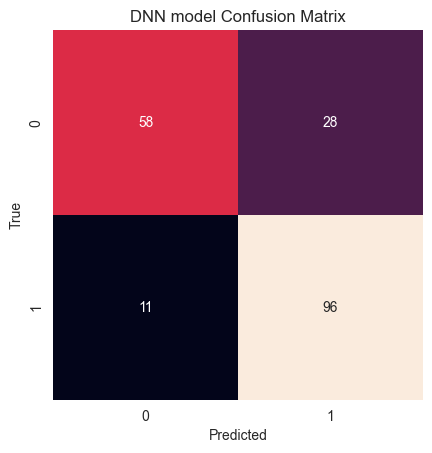

[2025-07-06 20:04:06] DNN model: F1 score: 0.8312 | Precision: 0.7742 | Recall: 0.8972


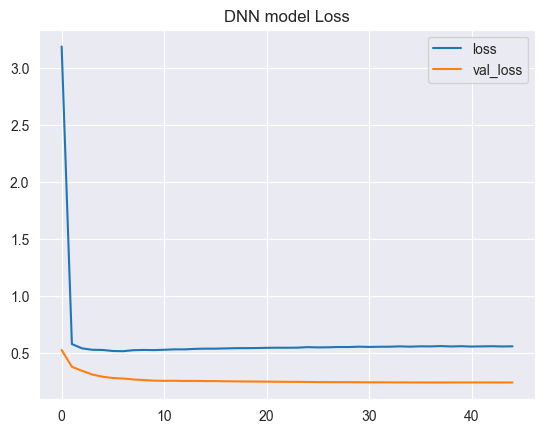

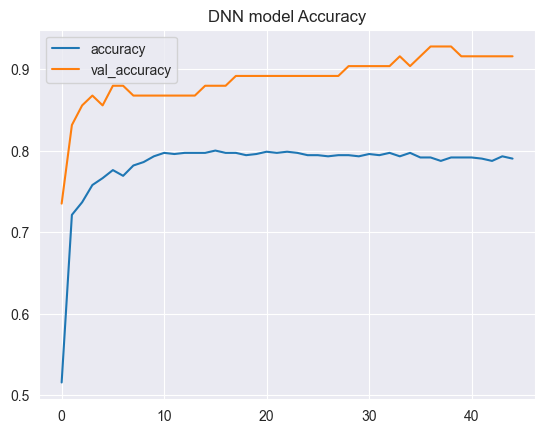

[2025-07-06 20:04:06] Done evaluating DNN model.


In [37]:
def dnn_model(X_train, y_train, X_test, y_test, X_validate, y_validate):
    tf_model = tf.keras.models.Sequential([
        tf.keras.layers.Input((X_train.shape[1],)),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dense(1, activation='sigmoid'),
    ])

    early_stopping = EarlyStopping(
        monitor='val_loss',
        min_delta=0.001,
        patience=10,
        restore_best_weights=True
    )

    tf_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    tf_hist = tf_model.fit(X_train, y_train, validation_data=(X_validate, y_validate),
                           callbacks=[early_stopping],
                           batch_size=8, epochs=60, verbose=2)

    history_df = pd.DataFrame(tf_hist.history)

    tf_model.summary()

    y_pred = tf_model.predict(X_test)
    y_pred = (y_pred > 0.3).astype(int)
    f1 = f1_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    draw_conf_mat(y_test, y_pred, title='DNN model Confusion Matrix')
    log(f'DNN model: F1 score: {f1:.4f} | Precision: {precision:.4f} | Recall: {recall:.4f}')
    ax_loss = history_df.loc[:, ['loss', 'val_loss']].plot(title='DNN model Loss');
    fig_loss = ax_loss.get_figure()
    fig_loss.savefig('./figures/dnn_model_loss.png')
    plt.show()
    plt.close(fig_loss)
    ax_acc = history_df.loc[:, ['accuracy', 'val_accuracy']].plot(title='DNN model Accuracy');
    fig_acc = ax_acc.get_figure()
    fig_acc.savefig('./figures/dnn_model_accuracy.png')
    plt.show()
    plt.close(fig_acc)


log('Evaluating DNN model:')
dnn_model(X_train, y_train, X_test, y_test, X_validate, y_validate)
log('Done evaluating DNN model.')

In [38]:
log_file.close()